# DATA CHALLENGE - THE ART OF THE POSSIBLE

### Submitted by Ashish Ahuja
***

## Dataset Description
The dataset is derived from emergency department of a hospital and consists of following information:

- MRN - Unique identifier of a patient
- Presentation Visit Number - Unique identifier for a visit
- Triage Priority - Identifies the priority of the visit based on triage nurse assessment
- Age - Age of patient
- Arrival Date - Date time when arrived in hospital
- Dr Seen Date - Date time when doctor saw the patient
- Depart Actual Date - Date time when patient left the hospital
- Depart Status Code - Code for patient representing discharge status
- Depart Status Desc. - Description of code for patient representing discharge status
- Depart. Dest. Code. - Code representing department where patient is sent to
- Depart. Dest. Desc. - Description of department where patient is sent to 
- TimeDiff Arrival - Actual Depart (mins) - Total treatment time of patient in the hospital
- TimeDiff TreatDrNr-Act.Depart (mins) - Total time spent by patient in emergency department after seeing a doctor.
- Presenting Complaint Code - Code for complaint made by the patient
- Presenting Complaint Desc. - Description of complaint made by the patient
- Diag Code - Code for diagnosis
- Diagnosis Desc. - Description of diagnosis



In [9]:
#Load libraries
import pandas as pd
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns
from datetime import datetime
import numpy as np

## Exploratory Data Analysis

This section of the notebook performs exploration of the dataset. Since the data represents functioning of hospital emergency department, questions have been grouped in three categories:


### 1. Factors affecting total time spent by patients in the hospital

1. What is the distribution of total time spent by patients in the hospital?
2. How is total treatment time dependent on the diagnosis?
3. How is total treatment time distributed with age of patient?
4. How is total treatment time dependent on the complaints mentioned by the patients?
5. How is total treatment time distributed with triage nurse assessment of the patients in hospital? 
6. How is total treatment time distributed with time when doctor sees a patient in the hospital?

### 2. Number of patients coming for treatment
1. What is the total number of patients recorded per day?
2. Is the number of patients recorded per day dependent on month or year? 
3. Is there any trend, any seasonal pattern to the number of patients visiting per day?

### 3. Patient complaints and diagonsis
1. What is the most common occuring diagnosis?
2. How many patients have multiple visits?
3. What is the most common occuring complaint from patients?
4. What information does 'Departure Status Description' presents about the patient handling?
5. What kind of complaints did patients reported who did not wait for diagnosis/discharge process to complete?




In [3]:
# Load Dataset 
filename = 'Generic ED 2009.xlsx'
dataset = pd.read_excel(filename)
dataset.head()

,MRN,Presentation Visit Number,Triage Priority,Age (yrs),Arrival Date,Dr Seen Date,Depart Actual Date,Depart Status Code,Departure Status Desc.,Depart. Dest. Code,Depart. Dest. Desc.,TimeDiff Arrival-Actual Depart (mins),TimeDiff TreatDrNr-Act. Depart (mins),Presenting Complaint Code,Presenting Complaint Desc.,Diag Code,Diagnosis Desc.
0,67269,63190,3,15,2009-01-01 00:17:00,2009-01-01 02:11:00,2009-01-01 12:30:00,H,ED SERVICE EVENT COMPLETED - DISCHARGED,DISCH,* DISCHARGED,733,619.0,4000.0,DRUG / ALCOHOL / POISONING,F43.9,EMOTIONAL CRISIS
1,444991,63193,4,15,2009-01-01 00:35:00,2009-01-01 03:01:00,2009-01-01 07:35:00,W,DID NOT WAIT,DNW,* DID NOT WAIT,420,274.0,9000.0,INJURY,Z53.2,DID NOT WAIT
2,444992,63194,4,8,2009-01-01 00:55:00,2009-01-01 01:08:00,2009-01-01 01:08:00,H,ED SERVICE EVENT COMPLETED - DISCHARGED,DISCH,* DISCHARGED,13,0.0,7000.0,EYE,H10.9,CONJUNCTIVITIS
3,444999,63213,3,12,2009-01-01 03:22:00,2009-01-01 04:34:00,2009-01-01 05:00:00,H,ED SERVICE EVENT COMPLETED - DISCHARGED,DISCH,* DISCHARGED,98,26.0,25000.0,PAIN,H60.9,OTITIS EXTERNA
4,429921,63217,4,15,2009-01-01 03:55:00,2009-01-01 06:30:00,2009-01-01 08:29:00,H,ED SERVICE EVENT COMPLETED - DISCHARGED,DISCH,* DISCHARGED,274,119.0,9000.0,INJURY,S83.6,KNEE SPRAIN / STRAIN


In [4]:
dataset.columns

Index(['MRN', 'Presentation Visit Number', 'Triage Priority', ' Age  (yrs)',
       'Arrival Date', 'Dr Seen Date', 'Depart Actual Date',
       'Depart Status Code', 'Departure Status Desc.', 'Depart. Dest. Code',
       'Depart. Dest. Desc.', 'TimeDiff Arrival-Actual Depart (mins)',
       'TimeDiff TreatDrNr-Act. Depart (mins)', 'Presenting Complaint Code',
       'Presenting Complaint Desc.', 'Diag Code', 'Diagnosis Desc.'],
      dtype='object')

In [5]:
# Checking for null values
dataset.isnull().sum()

MRN                                        0
Presentation Visit Number                  0
Triage Priority                            0
 Age  (yrs)                                0
Arrival Date                               0
Dr Seen Date                             184
Depart Actual Date                         0
Depart Status Code                         0
Departure Status Desc.                     0
Depart. Dest. Code                         0
Depart. Dest. Desc.                        0
TimeDiff Arrival-Actual Depart (mins)      0
TimeDiff TreatDrNr-Act. Depart (mins)      1
Presenting Complaint Code                 19
Presenting Complaint Desc.                19
Diag Code                                  0
Diagnosis Desc.                            0
dtype: int64

In [49]:
dataset.dtypes

MRN                                               int64
Presentation Visit Number                         int64
Triage Priority                                   int64
 Age  (yrs)                                       int64
Arrival Date                             datetime64[ns]
Dr Seen Date                             datetime64[ns]
Depart Actual Date                       datetime64[ns]
Depart Status Code                               object
Departure Status Desc.                           object
Depart. Dest. Code                               object
Depart. Dest. Desc.                              object
TimeDiff Arrival-Actual Depart (mins)             int64
TimeDiff TreatDrNr-Act. Depart (mins)           float64
Presenting Complaint Code                       float64
Presenting Complaint Desc.                       object
Diag Code                                        object
Diagnosis Desc.                                  object
dtype: object

In [63]:
from pandas_profiling import ProfileReport
ProfileReport(dataset, title="Pandas Profiling Report")

Summarize dataset:   0%|          | 0/31 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

***
## Data Cleaning 

It is seen there are some null values in a few columns. Following cells fill up null values as explained below:

- **Presenting Complaint Desc.** - Using the diagonsis description for these entries, null value is filled by the most common complaint desc for this diagnosis description. 
- **Presenting Complaint Code.** - Using the diagonsis code for these entries, null value is filled by the most common complaint code for this diagnosis description. 
- **TimeDiff TreatDrNr-Act. Depart (mins)** - Null value is filled by considering half of the TimeDiff Arrival-Actual Depart (mins). Since there is just one null entry, this approximate approach has been used. Other approaches like using median value for some diagnosis code can also be used.
- **Dr Seen Date** - Null values for this feature were not filled as information in TimeDiff TreatDrNr-Act. Depart (mins) column is present for these entries. 


In [6]:
dataset.loc[dataset['TimeDiff TreatDrNr-Act. Depart (mins)'].isnull(),'TimeDiff TreatDrNr-Act. Depart (mins)'] = dataset.loc[dataset['TimeDiff TreatDrNr-Act. Depart (mins)'].isnull(),'TimeDiff Arrival-Actual Depart (mins)']/2

In [7]:
#check for most diagnosis desc 
diag_desc = dataset[dataset['Presenting Complaint Code'].isnull()].loc[:,'Diagnosis Desc.'].unique().tolist()
diag_desc

['LACERATED FINGER',
 'DID NOT WAIT',
 'NO INJURY FOUND',
 'MENTAL ILLNESS - NO DIAGNOSIS',
 'MEDICAL REVIEW']

In [10]:
diag_desc = dataset[dataset['Presenting Complaint Code'].isnull()].loc[:,'Diagnosis Desc.'].unique().tolist()
#diag_desc
for diag in diag_desc:
    df_red = dataset[dataset['Diagnosis Desc.']==diag].groupby(['Presenting Complaint Desc.','Presenting Complaint Code'])['MRN'].count().reset_index()
    max_count = df_red.MRN.max()
    #print(df_red[df_red.MRN==max_count].iloc[0,0])
    val = df_red[df_red.MRN==max_count].iloc[0,0]
    val1 = df_red[df_red.MRN==max_count].iloc[0,1]
    dataset.loc[np.array(dataset['Presenting Complaint Code'].isnull()) & np.array(dataset['Diagnosis Desc.']==diag),'Presenting Complaint Desc.']= val
    dataset.loc[np.array(dataset['Presenting Complaint Code'].isnull()) & np.array(dataset['Diagnosis Desc.']==diag),'Presenting Complaint Code']= val1

In [45]:
#Checking combination of diagnosis code and diagnosis description together
dataset.groupby(by=['Diag Code', 'Diagnosis Desc.'])['Diag Code'].count()


Diag Code  Diagnosis Desc.                             
A05.9      FOOD POISOINING                                   7
           FOOD POISONING                                    6
A07.9      DYSENTERY                                         7
           PROTOZOAL INTESTINAL INFECTION                    5
A08.4      VIRAL GASTROENTERITIS                           868
                                                          ... 
Z60.9      SOCIAL ADMISSION                                  6
Z61.6      CHILD AT RISK                                    23
Z71.1      NORMAL PERIOD                                     5
Z76.0      ISSUE OF PRESCRIPTION                            13
ZZ.ZZ      PATIENT FOR DELETION BY CAMPUS ADMINISTRATOR      4
Name: Diag Code, Length: 662, dtype: int64

In [46]:
# Correct spelling errors
dataset.loc[dataset['Diagnosis Desc.']=='FOOD POISOINING','Diagnosis Desc.']='FOOD POISONING'


## Factors affecting time spent by patients in the hospital

### 1. What is the distribution of total time spent by patients in the hospital?
- The histogram plot below of total time shows a right skewed distribution suggesting that there are patients that stay for long in the hospital (extreme cases). 

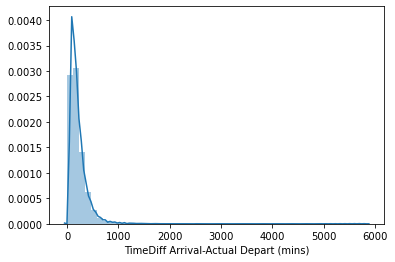

In [11]:
sns.distplot(dataset['TimeDiff Arrival-Actual Depart (mins)'])

In [12]:
dataset['TimeDiff Arrival-Actual Depart (mins)'].describe()

count    30188.000000
mean       204.656453
std        176.633280
min          0.000000
25%         94.000000
50%        160.000000
75%        262.000000
max       5828.000000
Name: TimeDiff Arrival-Actual Depart (mins), dtype: float64

### 2. How is total treatment time dependent on the diagnosis?

- Using diagnosis description, total number of different diagnosis and there occurence frequency is first determined. 
- This indicates the most commonly occurring illnesses treated by the emergency department. 
- It is interesting to note that most frequent diagnosis description is 'DID NOT WAIT'. This needs further analysis to determine what complaints were reported by these patients.
- From the box plot it can be seen that distribution of total treatment time changes with diagnosis. All of these distributions are right skewed, indicating presence of extreme cases (outliers) for all illness who take more time in the hospital. 
- As expected, total time spent in hospital is dependent on the diagnosis.


In [15]:
dataset['Diagnosis Desc.'].value_counts()

DID NOT WAIT                         3209
UPPER RESPIRATORY TRACT INFECTION    1699
ASTHMA - ACUTE                       1142
VIRAL INFECTION                      1027
BRONCHIOLITIS - ACUTE                 988
                                     ... 
ACHILLES TENDON RUPTURE                 1
FOLLICULITIS                            1
BUTTOCK CRUSH INJURY                    1
ACUTE CONFUSIONAL STATE                 1
MULTIPLE CHEST INJURIES                 1
Name: Diagnosis Desc., Length: 660, dtype: int64

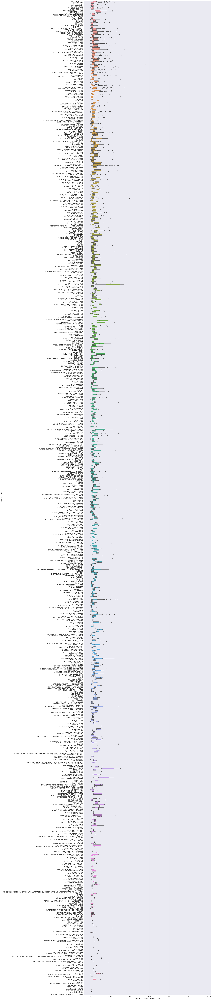

In [17]:
plt.figure(figsize=(25,200))
sns.set(font_scale=1.5)
sns.boxplot(x="TimeDiff Arrival-Actual Depart (mins)",y='Diagnosis Desc.', data=dataset,orient="h")

### 3. How is total treatment time distributed with age of patient?

- Dataset contains patients between age 0 to 15 years. 
- It can be seen from the boxplot below that the distribution of total treatment time is similar for all age from 0 to 15 years.
- Total treatment time distribution for each age group is right skewed indicating presence of extreme cases that take longer to recover. 

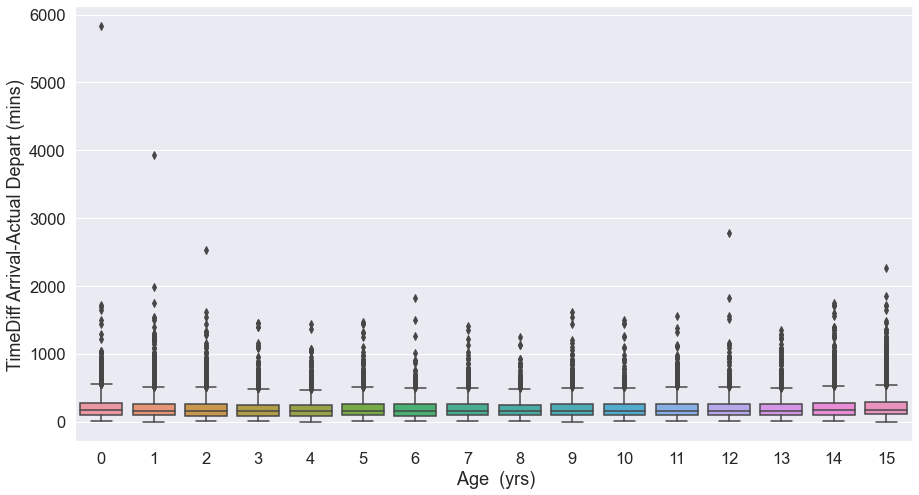

In [28]:
plt.figure(figsize=(15,8))

sns.boxplot(x = ' Age  (yrs)', y= "TimeDiff Arrival-Actual Depart (mins)",data=dataset)

### 4. How is total treatment time distributed with triage nurse assessment of the patients in hospital? 

- It can be seen from the box plot below that the median value of total time distribution reduces as triage priority value increases. This indicates that immediate attention (shorter response time) is given to the the patients with higher triage priority. 

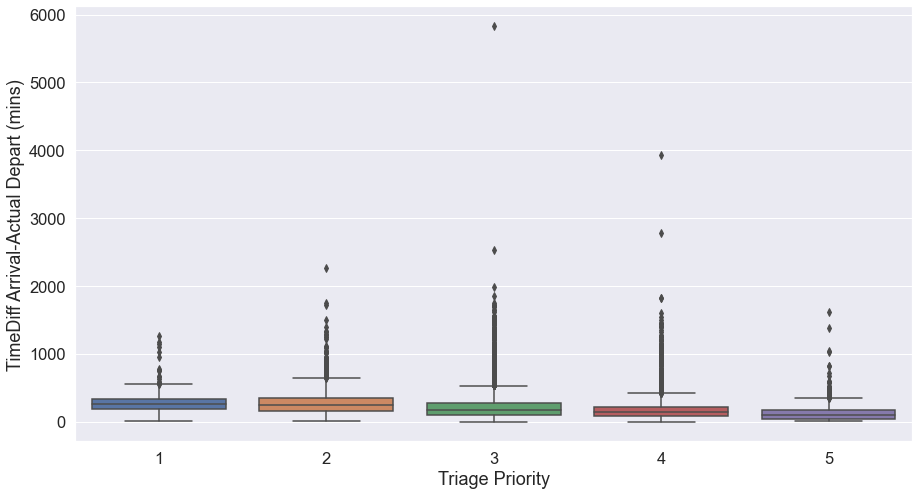

In [29]:
plt.figure(figsize=(15,8))
sns.boxplot(x = 'Triage Priority', y= "TimeDiff Arrival-Actual Depart (mins)",data=dataset)

### 5. How is total treatment time distributed with time when doctor sees a patient in the hospital?

- It can be seen from the scatter plot below that total treatment time in hospital and time when doctor attends to discharge time are highly correlated. This can also be seen in the correlation coefficient of 0.91.

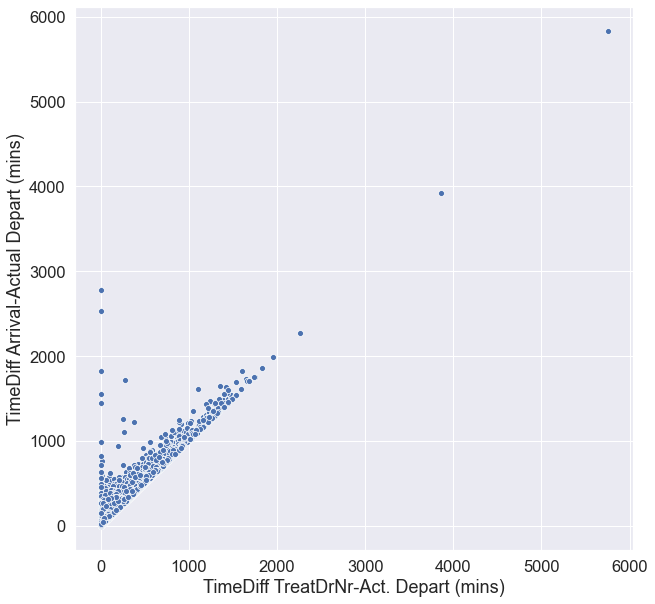

In [36]:
plt.figure(figsize=(10,10))
sns.scatterplot(x = 'TimeDiff TreatDrNr-Act. Depart (mins)', y= "TimeDiff Arrival-Actual Depart (mins)",data=dataset)

In [38]:
dataset.loc[:,['TimeDiff TreatDrNr-Act. Depart (mins)', "TimeDiff Arrival-Actual Depart (mins)"]].corr()

,TimeDiff TreatDrNr-Act. Depart (mins),TimeDiff Arrival-Actual Depart (mins)
TimeDiff TreatDrNr-Act. Depart (mins),1.0000,0.9196
TimeDiff Arrival-Actual Depart (mins),0.9196,1.0000


### 6. How is total treatment time dependent on the complaints mentioned by the patients?

- First of all frequency of different kinds of complaints is calculated.
- Box plot below shows distribution of total treatment time varies with the complaints recorded by the patients. As expected, type of complaint reported will affect the total treatment time of the patient. 

In [39]:
dataset['Presenting Complaint Desc.'].value_counts()

PAEDIATRIC                     10316
INJURY                          6127
PAIN                            2289
RESPIRATORY                     2183
ENVIRONMENTAL / TEMPERATURE     1447
                               ...  
INDIGESTION                        1
NEW DIAGNOSIS                      1
CARDIAC                            1
UNSTEADY                           1
RESPIRATORY ARREST                 1
Name: Presenting Complaint Desc., Length: 148, dtype: int64

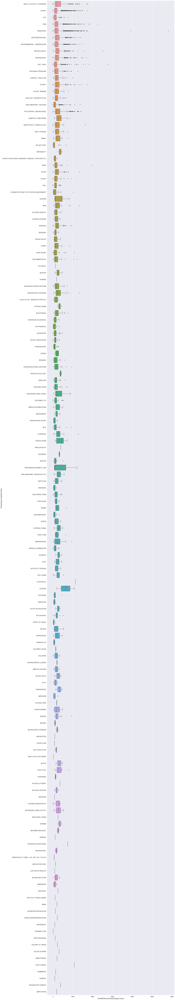

In [40]:
plt.figure(figsize=(25,200))
sns.set(font_scale=1.5)
sns.boxplot(x="TimeDiff Arrival-Actual Depart (mins)",y='Presenting Complaint Desc.', data=dataset,orient="h")

## Number of patients coming for treatment

### 1. What is the total number of patients recorded per day?
- Number of patients recorded per day by the department is plotted as a time series plot. 

### 2. Is the number of patients recorded per day dependent on month or year? 
- It can be seen that the count of patients recorded per day is dependent on the month and year. 

### 3. Is there any trend, any seasonal pattern to the number of patients visiting per day?
- It is seen from the plot that there is a cyclic component to the time series, indicating a pattern with respect to month/year in the number of patients that come to the hosiptal. 

In [71]:
pat_date = dataset['Arrival Date'].apply(lambda x: x.strftime('%Y-%m-%d'))

Text(0, 0.5, 'Number of Patients per day')

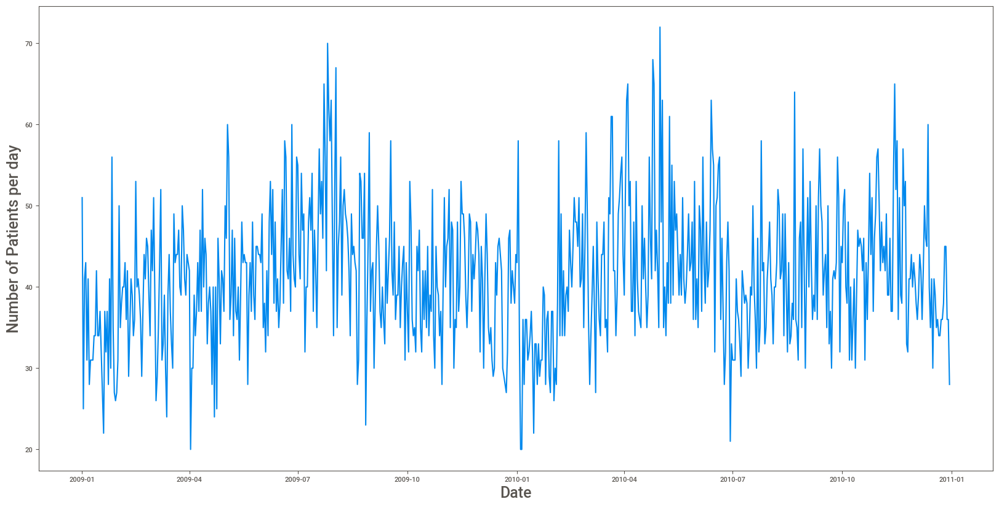

In [72]:
pat_date.value_counts(sort=False).reset_index()
pat_date = pat_date.value_counts(sort=False).reset_index()
pat_date.columns = ['Arrival Date','patient_count']
pat_date['Arrival Date'] = pd.to_datetime(pat_date['Arrival Date'],format = '%Y-%m-%d')
pat_date.sort_values(by=['Arrival Date'], inplace=True)
fig = plt.figure(figsize=(20,10))
ax = fig.add_subplot(111)
plt.plot(pat_date['Arrival Date'],pat_date['patient_count'])
ax.set_xlabel('Date')
ax.set_ylabel('Number of Patients per day')


## NEXT STEPS - SETTING UP THE BUSINESS PROBLEM

Efficient running of emergency department needs planning of resources, availability of adequate hospital staff etc. This can be facilitated if an estimate is available on the total time a patient is expected to spend in the hospital after arrival. 
Exploratory Data Analysis for this dataset showed dependency of total treatment time on many factors like diagonsis, age of patient, complaint description etc. 

In addition to above, planning of hospital operation can be further improved if total demand in terms of number of patients per day can be forecasted using historical data. It is seen that there is a periodic dependency in the number of patients per day with time of the year. 

Using these insights, it is proposed to devise the following two pipelines :

### Prediction of total treatment time of patients 

- Total treatment time of a patient is predicted using information in features like diagnosis, nurse priority, compliant etc using **XGBOOST - Regression**
- Details and results are presented in jupyter notebook **Hospital_Time_Prediction.ipynb**

### Forecasting of number of patients per day 

- Using historical count of patients per day, total demand on hospital is forecasted with a horizon of next 60 days using **Time Series Forecasting Techniques**.
- Details and results are presented in jupyter notebook **Patients_Count_Forecasting.ipynb**



# ADDITIONAL QUESTIONS

## Patient complaints and diagonsis
### 1. What is the most common occuring diagnosis?
- It is seen that most common diagnosis is **UPPER RESPIRATORY TRACT INFECTION** after exlcuding DID NOT WAIT. 



In [44]:
dataset['Diagnosis Desc.'].value_counts()

DID NOT WAIT                         3209
UPPER RESPIRATORY TRACT INFECTION    1699
ASTHMA - ACUTE                       1142
VIRAL INFECTION                      1027
BRONCHIOLITIS - ACUTE                 988
                                     ... 
ACHILLES TENDON RUPTURE                 1
FOLLICULITIS                            1
BUTTOCK CRUSH INJURY                    1
ACUTE CONFUSIONAL STATE                 1
MULTIPLE CHEST INJURIES                 1
Name: Diagnosis Desc., Length: 660, dtype: int64

### 2. How many patients have multiple visits?
- It can be seen below that patients have mulitple visits. This gives an indication about recurring complaints or seasonal diseases. 


In [47]:
dataset['MRN'].value_counts()

416537    68
449734    34
449963    26
359964    25
385065    24
          ..
451002     1
479676     1
458240     1
489088     1
320156     1
Name: MRN, Length: 20263, dtype: int64

### 3. What is the most common occuring complaint from patients?



In [48]:
dataset['Presenting Complaint Desc.'].value_counts()

PAEDIATRIC                     10316
INJURY                          6127
PAIN                            2289
RESPIRATORY                     2183
ENVIRONMENTAL / TEMPERATURE     1447
                               ...  
INDIGESTION                        1
NEW DIAGNOSIS                      1
CARDIAC                            1
UNSTEADY                           1
RESPIRATORY ARREST                 1
Name: Presenting Complaint Desc., Length: 148, dtype: int64

### 4. What information does 'Departure Status Description' presents about the patient handling?
- It can be seen below that majority of the patients (around 75%) are discharged after completing the treatment in emergency department.
- Around 11 % of patients are admitted to the hospital and about 10% of the patients did not wait for discharge process to complete. It will be interesting to analyse these patients to understand the complaints they had.

In [82]:
dataset['Departure Status Desc.'].value_counts()

ED SERVICE EVENT COMPLETED - DISCHARGED          22864
ADMITTED (EXCL.ED BED)                            3364
DID NOT WAIT                                      3303
TRANSFER TO ANOTHER HOSPITAL                       424
LEFT AFTER TREATMENT COMMENCED                     217
PATIENT FOR DELETION BY CAMPUS ADMINISTRATOR         6
DIED IN ED                                           6
** ADMITTED TO OBS WARD **                           3
DEAD ON ARRIVAL (NO TREATMENT PROVIDED IN ED)        1
Name: Departure Status Desc., dtype: int64

In [83]:
dataset['Depart Status Code'].value_counts()

H     22864
A      3364
W      3303
T       424
L       217
ZZ        6
E         6
S         3
D         1
Name: Depart Status Code, dtype: int64

In [102]:
dataset['Depart. Dest. Desc.'].value_counts()

* DISCHARGED                              22844
2F - PAEDIATRICS                           3149
DID NOT WAIT                               2374
* DID NOT WAIT                              865
TRANSFERRED TO ANOTHER HEALTH FACILITY      418
* LEFT AGAINST MEDICAL ADVICE               193
2A - MENTAL HEALTH                          125
* CHOOSING TO ATTEND FMC (DNW)               46
OTHER                                        29
2I - ORTHOPEDICS                             28
* DISCHARGE LIKELY                           27
2H - SURGICAL WARD                           19
* DID NOT WAIT PRIOR TO TRIAGE               16
THEATRE SUITE                                11
* ADMISSION LIKELY                            7
DIED IN ED                                    6
INTENSIVE CARE UNIT                           5
2G - MEDICAL WARD                             5
BIRTH SUITE                                   5
3A - MEDICAL WARD                             3
3C - MEDICAL WARD                       

### 5. What kind of complaints did patients reported who did not wait for diagnosis/discharge process to complete?

- Following plots present information on the age group and complaints of patients who did not wait for diagnosis. It is seen that patients belong to all age groups and different types of complaints. 

In [57]:
df = dataset[dataset['Diagnosis Desc.']=='DID NOT WAIT']

In [61]:
df.head()

,MRN,Presentation Visit Number,Triage Priority,Age (yrs),Arrival Date,Dr Seen Date,Depart Actual Date,Depart Status Code,Departure Status Desc.,Depart. Dest. Code,Depart. Dest. Desc.,TimeDiff Arrival-Actual Depart (mins),TimeDiff TreatDrNr-Act. Depart (mins),Presenting Complaint Code,Presenting Complaint Desc.,Diag Code,Diagnosis Desc.
1,444991,63193,4,15,2009-01-01 00:35:00,2009-01-01 03:01:00,2009-01-01 07:35:00,W,DID NOT WAIT,DNW,* DID NOT WAIT,420,274.0,9000.0,INJURY,Z53.2,DID NOT WAIT
46,367128,63393,4,2,2009-01-01 22:42:00,NaT,2009-01-02 00:26:00,W,DID NOT WAIT,DNW,* DID NOT WAIT,104,0.0,6000.0,ENVIRONMENTAL / TEMPERATURE,Z53.2,DID NOT WAIT
63,410820,63481,4,1,2009-01-02 12:42:00,2009-01-02 15:07:00,2009-01-02 15:07:00,W,DID NOT WAIT,DNW,DID NOT WAIT,145,0.0,9000.0,INJURY,Z53.2,DID NOT WAIT
69,276818,63525,5,6,2009-01-02 17:06:00,2009-01-02 18:46:00,2009-01-02 18:49:00,W,DID NOT WAIT,DNW,DID NOT WAIT,103,3.0,8000.0,GASTROINTESTINAL,Z53.2,DID NOT WAIT
71,443551,63545,3,0,2009-01-02 18:40:00,2009-01-02 19:57:00,2009-01-02 20:04:00,W,DID NOT WAIT,DNW,* DID NOT WAIT,84,7.0,24000.0,PAEDIATRIC,Z53.2,DID NOT WAIT


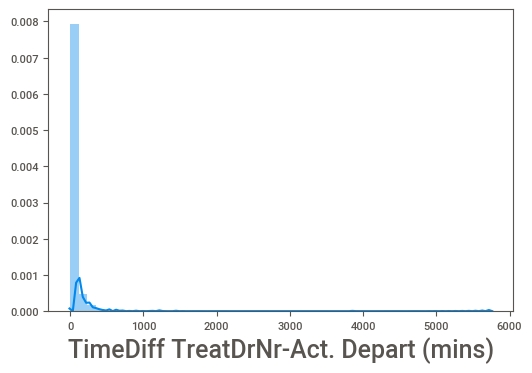

In [62]:
sns.distplot(df['TimeDiff TreatDrNr-Act. Depart (mins)'])

In [55]:
df['Presenting Complaint Desc.'].value_counts()

PAEDIATRIC                     1140
INJURY                          485
PAIN                            260
ENVIRONMENTAL / TEMPERATURE     259
RESPIRATORY                     219
                               ... 
DROWSINESS                        1
MASS                              1
NON-EMERGENT                      1
DYSURIA                           1
PSYCHIATRIC                       1
Name: Presenting Complaint Desc., Length: 81, dtype: int64

In [48]:
df1=df['Presenting Complaint Desc.'].value_counts()

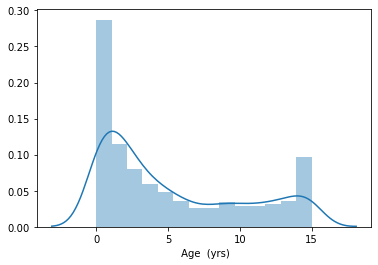

In [64]:
sns.distplot(df[' Age  (yrs)'])

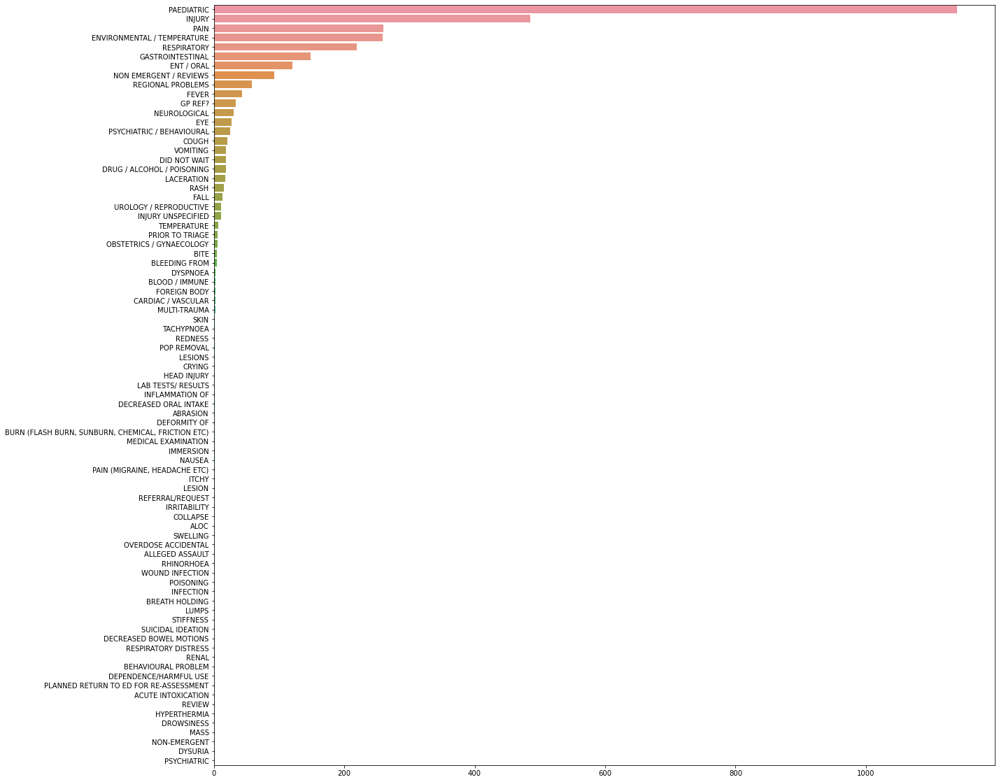

In [57]:
plt.figure(figsize=(20,20))
sns.barplot(df1.values,df1.index)

In [54]:
import sweetviz as sv

In [55]:
my_report = sv.analyze(dataset, target_feat='TimeDiff Arrival-Actual Depart (mins)')
my_report.show_html() # Default arguments will generate to "SWEETVIZ_REPORT.html"

:FEATURES DONE:                    |█████████████████████| [100%]   00:09  -> (00:00 left)
:PAIRWISE DONE:                    |█████████████████████| [100%]   00:01  -> (00:00 left)


Creating Associations graph... DONE!
Report SWEETVIZ_REPORT.html was generated! NOTEBOOK/COLAB USERS: no browser will pop up, the report is saved in your notebook/colab files.
